In [29]:
import geopandas as gpd
import numpy as np
import folium
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Markdown, display

import milton_maps as mm

sns.set_style("darkgrid", {"axes.facecolor": ".9"})
sns.set(rc = {'figure.figsize':(15,8)})
sns.set_context("notebook")

In [3]:
town_boundaries = gpd.read_file("../data/processed/town_boundaries.shp.zip").set_index("TOWN_ID")
milton_quincy_boundaries = town_boundaries[town_boundaries.TOWN.isin(["MILTON", "QUINCY"])]
milton_quincy_boundaries.shape

(2, 19)

In [2]:
residential_tax_parcels = joblib.load("../data/processed/residential_tax_parcels.pkl")
residential_tax_parcels.shape

(32387, 28)

In [15]:
assessor_db = joblib.load("../data/processed/milton_assessor_db.pkl")

Steps:

1. Bounding box for Milton
2. Generate meshgrid for construction year heatmap
3. For each point, calculate average construction date of N nearest neighbor properties, and add to image.  If no properties within x meters, black.
4. Display construction year heatmap

In [27]:
(xmin, ymin, xmax, ymax) = town_boundaries.loc[189].geometry.bounds

In [28]:
(xmin, ymin, xmax, ymax)

(230482.1424999982, 883438.2446000017, 238662.33250000328, 892056.4745999984)

In [23]:
home = residential_tax_parcels[residential_tax_parcels.SITE_ADDR=="134 NAHANTON AV"].geometry.centroid[0]
print(home)

POINT (235887.40340404026 886855.6481233176)


In [24]:
next_door = residential_tax_parcels[residential_tax_parcels.SITE_ADDR=="124 NAHANTON AV"].geometry.centroid[0]
print(next_door)

POINT (235863.2002094912 886880.2816770356)


In [25]:
home.distance(next_door)

34.53413666442441

In [56]:
from shapely.geometry import Point
xticks = np.arange(xmin, xmax, 50.0)
yticks = np.arange(ymin, ymax, 50.0)
X, Y = np.meshgrid(xticks, yticks, indexing='xy')
#N = X.shape[0]*X.shape[1]
x = X.ravel()
y = Y.ravel()
p = [Point(xx, yy) for xx,yy in zip(x,y)]

In [76]:
milton_grid = gpd.GeoDataFrame(data={'x': x, 'y': y}, geometry=p, crs="EPSG:26986")
milton_grid.head()

,x,y,geometry
0,230482.1425,883438.2446,POINT (230482.142 883438.245)
1,230532.1425,883438.2446,POINT (230532.142 883438.245)
2,230582.1425,883438.2446,POINT (230582.142 883438.245)
3,230632.1425,883438.2446,POINT (230632.142 883438.245)
4,230682.1425,883438.2446,POINT (230682.142 883438.245)


<AxesSubplot:>

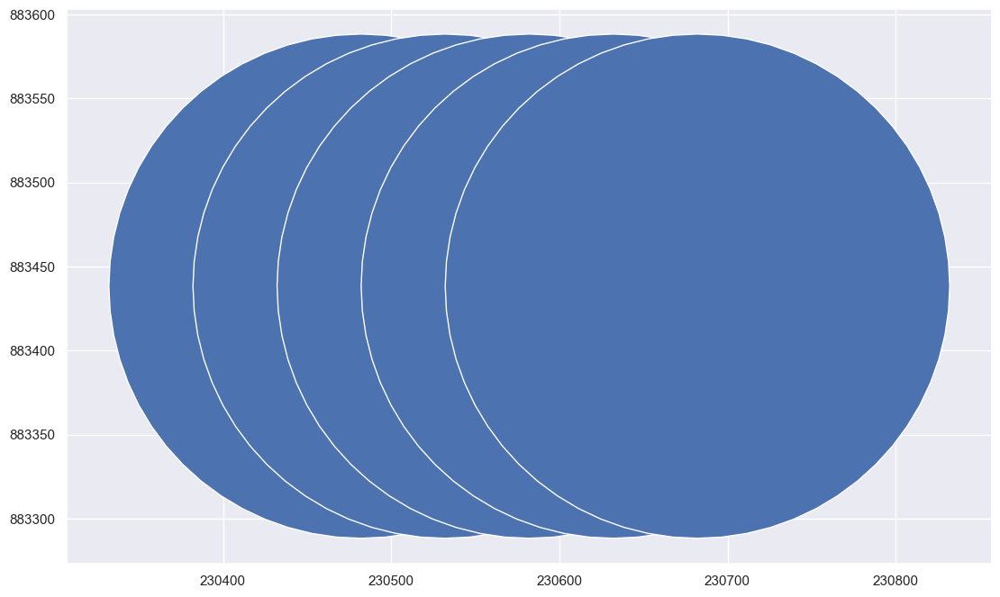

In [77]:
milton_grid_buffered = milton_grid.copy()
milton_grid_buffered['geometry'] = milton_grid_buffered.geometry.buffer(150)
milton_grid_buffered.head().plot()

In [63]:
residential_parcel_centers = residential_tax_parcels.copy()
residential_parcel_centers['geometry'] = residential_parcel_centers['geometry'].centroid

In [84]:
grid_neighbors = gpd.sjoin(milton_grid_buffered, residential_parcel_centers, predicate="contains")
print(grid_neighbors.shape)
grid_neighbors.groupby(["x", "y"])['index_right'].count().shape

(302948, 31)


(10746,)

In [92]:
grid_neighbors2 = residential_parcel_centers.sjoin(milton_grid_buffered, predicate="within")
grid_neighbors2.shape

(302948, 31)

In [98]:
def grid_distance(row):
    dist = row['geometry'].distance(Point(row['x'], row['y']))
    return dist

grid_neighbors2['neighbor_dist'] = grid_neighbors2.apply(grid_distance, axis=1)

In [99]:
grid_neighbors2.head()

,SHAPE_Leng,SHAPE_Area,MAP_PAR_ID,POLY_TYPE,MAP_NO,SOURCE,PLAN_ID,LAST_EDIT,BND_CHK,NO_MATCH,...,STYLE,LOT_SIZE,TOTAL_VAL,LAND_VAL,SITE_ADDR,IS_RESIDENTIAL,index_right,x,y,neighbor_dist
LOC_ID,,,,,,,,,,,,,,,,,,,,,
F_757603_2907021,718.018773,21213.803766,A 10 1B,FEE,A,ASSESS,A-9-10,20180101.0,None,N,...,CONTEMPORY,2.19,1459500.0,656200.0,1259 BRUSH HILL RD,True,8208,230882.1425,885938.2446,128.588769
F_757603_2907021,718.018773,21213.803766,A 10 1B,FEE,A,ASSESS,A-9-10,20180101.0,None,N,...,CONTEMPORY,2.19,1459500.0,656200.0,1259 BRUSH HILL RD,True,8209,230932.1425,885938.2446,124.374803
F_757603_2907021,718.018773,21213.803766,A 10 1B,FEE,A,ASSESS,A-9-10,20180101.0,None,N,...,CONTEMPORY,2.19,1459500.0,656200.0,1259 BRUSH HILL RD,True,8210,230982.1425,885938.2446,139.295053
F_758074_2906873,816.535998,27069.928790,A 10 12,FEE,A,OTHER,A-9-10,20120120.0,None,N,...,COLONIAL,6.54,2079700.0,754100.0,1425 BRUSH HILL RD,True,8210,230982.1425,885938.2446,111.604083
F_758204_2906549,641.513221,21533.836193,A 10 7,FEE,A,OTHER,A-9-10,20120120.0,None,N,...,COLONIAL,5.21,2664100.0,739900.0,1451 BRUSH HILL RD,True,8210,230982.1425,885938.2446,120.765580


In [137]:
gn = grid_neighbors2.groupby(["x", "y"]).neighbor_dist.count()
gn.head()

x            y          
230782.1425  886038.2446    1
             886088.2446    1
230832.1425  885988.2446    1
             886038.2446    1
             886088.2446    1
Name: neighbor_dist, dtype: int64

In [128]:
df_temp = grid_neighbors2[np.isclose(grid_neighbors2.x,231032.1425, rtol=1e-8) & np.isclose(grid_neighbors2.y,887738.2446, rtol=1e-8)]

<AxesSubplot:>

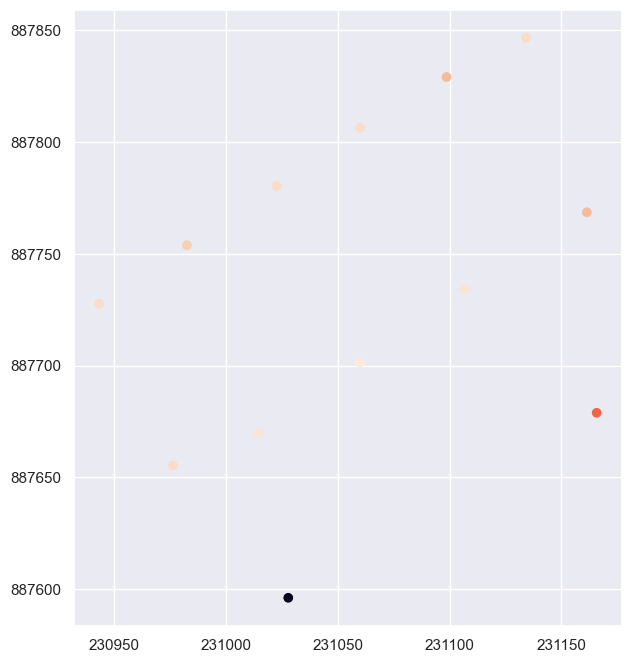

In [134]:
df_temp.plot(column="YEAR_BUILT")

In [111]:
df_temp.sort_values(by="neighbor_dist", ascending=True).iloc[:100]['YEAR_BUILT'].mean()

1958.0

In [139]:
def knearest_avg(df, k, field):
    knearest_avg = df.sort_values(by="neighbor_dist", ascending=True).iloc[:k][field].mean()
    return knearest_avg

avg_year_built = grid_neighbors2.groupby(["x", "y"]).apply(lambda g: knearest_avg(g, 10, "YEAR_BUILT")).reset_index()
avg_year_built.head()

,x,y,0
0,230782.1425,886038.2446,1983.0
1,230782.1425,886088.2446,1983.0
2,230832.1425,885988.2446,1983.0
3,230832.1425,886038.2446,1983.0
4,230832.1425,886088.2446,1983.0


In [140]:
avg_year_built.shape

(10746, 3)

In [143]:
type(avg_year_built)

pandas.core.frame.DataFrame

In [150]:
geom = avg_year_built.apply(lambda row: Point(row.x, row.y), axis=1)
avg_year_built_df = gpd.GeoDataFrame(data={"x": avg_year_built.x,
                                           "y": avg_year_built.y,
                                           "avg_year": avg_year_built[0]},
                                     geometry=geom,
                                     crs="EPSG:26986",
)

/opt/anaconda3/envs/milton-maps/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:127: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


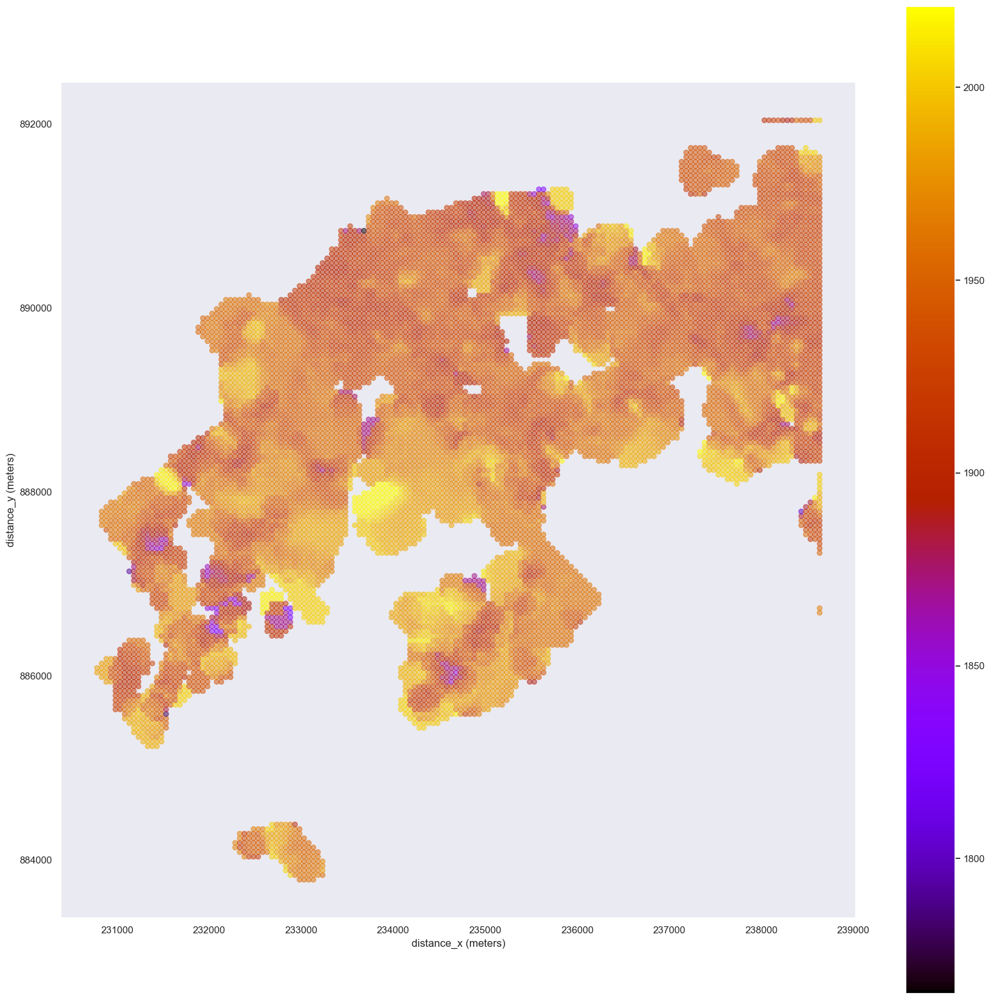

In [157]:
fig, ax = plt.subplots(1, figsize=(20,20))
ax = mm.plot_map(avg_year_built_df,
            column="avg_year",
            categorical=False,
            markersize=30,
            cmap='gnuplot',
            alpha=0.5,
            ax=ax
)

In [182]:
milton_quincy_boundaries.to_crs("EPSG:3857")

,TOWN,POP1980,POP1990,POP2000,POPCH90_00,TYPE,FOURCOLOR,FIPS_STCO,CCD_MCD,FIPS_PLACE,FIPS_MCD,FIPS_COUNT,POP2010,POPCH00_10,POPCH80_90,SHAPE_AREA,ACRES,SQUARE_MIL,geometry
TOWN_ID,,,,,,,,,,,,,,,,,,,
189,MILTON,25696,25725,26062,337,T,2,25021,075,41690,25021075,21,27003,941,29,3.446452e+07,8516.361867,13.306766,"MULTIPOLYGON (((-7912516.827 5201433.382, -791..."
243,QUINCY,83682,84985,88025,3040,C,3,25021,460,55745,25021460,21,92271,4246,1303,4.484078e+07,11080.387523,17.313041,"MULTIPOLYGON (((-7901685.723 5199628.431, -790..."


In [207]:
map_center = town_boundaries.to_crs("EPSG:4326").loc[189].geometry.centroid
milton_map = folium.Map(width=800,height=800, location=[map_center.y, map_center.x], zoom_start=13)
folium.GeoJson(milton_quincy_boundaries.to_crs("EPSG:3857").loc[[189]].geometry).add_to(milton_map)
display(milton_map)

In [209]:
(map_center.y, map_center.x)

(42.24126464755262, -71.08431489974897)

In [217]:
avg_year_built_df.avg_year.max()

2021.0

In [230]:
import branca.colormap as cm
colormap = cm.LinearColormap(colors=['red', 'blue', 'white'], index=[1765, 1900, 2021],vmin=1765,vmax=2021)

In [227]:
avg_year_built_df[avg_year_built_df.avg_year.isnull()]

,x,y,avg_year,geometry
695,231732.1425,885938.2446,NaN,POINT (231732.142 885938.245)
743,231782.1425,886038.2446,NaN,POINT (231782.142 886038.245)


In [231]:
map_center = town_boundaries.to_crs("EPSG:4326").loc[189].geometry.centroid
milton_map = folium.Map(width=800,height=800, location=[map_center.y, map_center.x], zoom_start=13)
folium.GeoJson(milton_quincy_boundaries.to_crs("EPSG:3857").loc[[189]].geometry).add_to(milton_map)
for i, row in avg_year_built_df.fillna(0).to_crs("EPSG:4326").iterrows():
    folium.CircleMarker(
        (row.geometry.y, row.geometry.x),
        radius=1,
        color=colormap(row['avg_year'])
    ).add_to(milton_map)
folium.CircleMarker((map_center.y, map_center.x), radius=1, color="yellow").add_to(milton_map)
display(milton_map)

In [189]:
milton_quincy_boundaries.to_crs("EPSG:3857").loc[[189]].geometry

TOWN_ID
189    MULTIPOLYGON (((-7912516.827 5201433.382, -791...
Name: geometry, dtype: geometry

In [201]:
folium.GeoJson(data=avg_year_built_df.to_crs("EPSG:3857")).add_to(milton_map)


In [198]:
from folium.plugins import HeatMap

hm = avg_year_built_df.to_crs("EPSG:3857")

hm_wide = HeatMap(
    name='heatmap',
    data=list(
        zip(hm.y.tolist(),
            hm.x.tolist(),
            hm['avg_year'].fillna(0).tolist())
    ),
    min_opacity=1,
    radius=20,
    blur=40,
    max_zoom=12
).add_to(milton_map)

#folium.LayerControl().add_to(milton_map)
display(milton_map)